# Лекция 3

```
- Введение в Машинное обучение, ИСП РАН (Весна 2025)
- Инструкторы: Александр Безносиков и Ко
- Автор ноутбука: Дмитрий Береснев
```

---

Содержание

- Сетка полного перебора (надежды нет)
    - Сетка обычной функции
    - Сетка плохой функции
- Направления градиентов и шаг обучения
- Траектория сходимости методов оптимизации
    - Параболоид
    - Функция Розенброка
- Сравнение стохастики (размеров батча)
- Сравнение схем подбора шага (schedulers)

---

In [ ]:
import os
import time
import warnings
from functools import partial
from typing import Callable, Optional

import matplotlib.pyplot as plt
import numpy as np
import plotly.graph_objects as go
import torch
import torch.nn as nn
import torch.optim as optim
from dash import Dash, Input, Output, State, dcc, html
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Subset
from torchvision import datasets, transforms
from tqdm import tqdm

warnings.filterwarnings("ignore")

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
DEVICE

device(type='cuda')

## Утилиты

In [2]:
ASSETS_PATH = "./assets/"

In [ ]:
def set_seed(seed: int = 420):
    np.random.seed(seed)
    torch.manual_seed(seed)
    if DEVICE.type == "cuda":
        torch.cuda.manual_seed(seed)

In [4]:
def save_plt(name: str):
    plt.savefig(
        f"{os.path.join(ASSETS_PATH, name)}.svg",
        bbox_inches="tight",
        pad_inches=0.1,
        format="svg",
    )
    plt.savefig(
        f"{os.path.join(ASSETS_PATH, name)}_transparent.svg",
        bbox_inches="tight",
        pad_inches=0.1,
        format="svg",
        transparent=True,
    )
    return None


def save_plotly(name: str, fig: go.Figure, svg: bool = True, html: bool = True):
    if html:
        fig.write_html(f"{os.path.join(ASSETS_PATH, name)}.html")
    if svg:
        fig.write_image(f"{os.path.join(ASSETS_PATH, name)}.svg", format="svg")
    return None

## Сетка полного перебора (надежды нет)

In [5]:
def plot_interactive_grid(
    f: Callable,
    number_of_points: int = 100,
    optimum: Optional[tuple[float, float]] = None,
    x_range: tuple[float, float] = (0, 1),
    y_range: tuple[float, float] = (0, 1),
    grid_sparsity: int = 5,
    save_img_title: Optional[str] = None,
    **kwargs,
):
    x = np.linspace(*x_range, number_of_points + 1)
    y = np.linspace(*y_range, number_of_points + 1)
    x_grid, y_grid = np.meshgrid(x, y)
    z = f(x_grid, y_grid)

    fig = go.Figure()

    fig.add_trace(go.Surface(z=z, x=x_grid, y=y_grid, colorscale="Viridis", opacity=0.7))

    # Grid
    shift_x = (x_range[1] - x_range[0]) * grid_sparsity / number_of_points / 2
    shift_y = (y_range[1] - y_range[0]) * grid_sparsity / number_of_points / 2
    for i in range(0, number_of_points, grid_sparsity):
        shifted_x = x[i] + shift_x
        fig.add_trace(
            go.Scatter3d(
                x=[shifted_x] * len(y),
                y=y,
                z=f(shifted_x, y),
                mode="lines",
                line=dict(color="black", width=2),
                showlegend=False,
            )
        )
        shifted_y = y[i] + shift_y
        fig.add_trace(
            go.Scatter3d(
                x=x,
                y=[shifted_y] * len(x),
                z=f(x, shifted_y),
                mode="lines",
                line=dict(color="black", width=2),
                showlegend=False,
            )
        )

    title = None
    if optimum is not None:
        min_x, min_y = optimum
        min_z = f(min_x, min_y)
        fig.add_trace(
            go.Scatter3d(
                x=[min_x],
                y=[min_y],
                z=[min_z],
                mode="markers",
                marker=dict(color="red", size=8),
                name="Оптимум",
            )
        )
        title = f"Минимум - ({min_x:.2f}, {min_y:.2f})"

    fig.update_layout(
        title=title,
        legend={
            "orientation": "h",
            "yanchor": "bottom",
            "y": 1,
            "xanchor": "right",
            "x": 1,
        },
        width=700,
        height=600,
        margin=dict(l=30, r=35, t=50, b=30),
        **kwargs,
    )
    fig.show()

    if save_img_title is not None:
        save_plotly(save_img_title, fig)


def objective_function(x, y):
    return 2 * (x - 0.5) ** 2 + (y - 0.5) ** 2


plot_interactive_grid(
    objective_function,
    optimum=(0.5, 0.5),
    grid_sparsity=10,
    save_img_title="grid_function",
    scene=dict(camera=dict(eye=dict(x=0.5 * 1.3, y=1.5 * 1.3, z=0.7 * 1.3))),
)

In [6]:
def bad_function(x, y):
    scale = -200
    return np.minimum(
        -np.exp(scale * (x - 0.5) ** 2) - np.exp(scale * (y - 0.5) ** 2), -1.5
    )


plot_interactive_grid(
    bad_function,
    optimum=(0.5, 0.5),
    grid_sparsity=10,
    save_img_title="grid_bad",
    scene=dict(camera=dict(eye=dict(x=0.7 * 1.4, y=1.35 * 1.4, z=0.8 * 1.4))),
)

## Направления градиентов и шаг обучения

In [ ]:
def add_plot_arrow(color, name, visible: bool | str = "legendonly"):
    """Добавляет стрелку к графику"""
    return go.Scatter(
        mode="lines+markers",
        line=dict(dash="dash", color=color, width=2),
        marker=dict(symbol="arrow-bar-up", size=10, angleref="previous", color=color),
        name=name,
        visible=visible,
    )


def update_gradient_directions_plot(
    f: Callable,
    nabla_f: Callable,
    number_of_points: int,
    optimum: Optional[tuple[float, float]],
    x_range: tuple[float, float],
    y_range: tuple[float, float],
    start_point: tuple[float, float],
    learning_rate: float,
    iterations: int,
) -> tuple:
    new_x, new_y = [], []

    if optimum is not None:
        optimum_x, optimum_y = optimum
        new_x.append([optimum_x])
        new_y.append([optimum_y])

    # Запускаем Градиентный спуск
    points = [(start_point)]

    for _ in range(iterations):
        x, y = points[-1]
        gx, gy = nabla_f(x, y)
        new_point = (x - learning_rate * gx, y - learning_rate * gy)
        points.append(new_point)

    points = np.array(points)

    for i in range(len(points)):
        x, y = points[i]
        gx, gy = nabla_f(x, y)

        new_x.append([x, x + learning_rate * gx, None])
        new_y.append([y, y + learning_rate * gy, None])

        new_x.append([x, x - learning_rate * gx, None])
        new_y.append([y, y - learning_rate * gy, None])

    max_x, max_y = max(max(t[:2]) for t in new_x), max(max(t[:2]) for t in new_y)
    min_x, min_y = min(min(t[:2]) for t in new_x), min(min(t[:2]) for t in new_y)

    df_x, df_y = (x_range[1] - x_range[0]) / 10, (y_range[1] - y_range[0]) / 10
    new_x_range = (min(x_range[0], min_x - df_x), max(x_range[1], max_x + df_x))
    new_y_range = (min(y_range[0], min_y - df_y), max(y_range[1], max_y + df_y))

    x_vals, y_vals = (
        np.linspace(*new_x_range, number_of_points),
        np.linspace(*new_y_range, number_of_points),
    )
    new_x.append(x_vals)
    new_y.append(y_vals)
    x_grid, y_grid = np.meshgrid(x_vals, y_vals)
    new_z = f(x_grid, y_grid)

    new_x.append(points[:, 0])
    new_y.append(points[:, 1])

    return [None for _ in range(len(new_x) - 2)] + [new_z] + [None], new_x, new_y


def plot_gradient_directions(
    f: Callable,
    nabla_f: Callable,
    number_of_points: int = 100,
    optimum: Optional[tuple[float, float]] = None,
    x_range: tuple[float, float] = (-5, 0.5),
    y_range: tuple[float, float] = (-5, 0.5),
    start_point: tuple[float, float] = (-4, -4),
    learning_rates_range: tuple[float, float, int] = (5e-3, 0.25, 50),
    iterations: int = 6,
    show_gradients: bool | list[int] = False,
    show_anti_gradients: bool | list[int] = False,
    active_lr: Optional[int] = None,
    save_img_title: Optional[str] = None,
    **kwargs,
):
    fig = go.Figure()

    traces = []

    if optimum is not None:
        traces.append(
            go.Scatter(
                mode="markers",
                marker=dict(size=18, symbol="x", color="firebrick"),
                name="Оптимум",
            )
        )

    # Добавляем ползунок
    learning_rates = np.linspace(*learning_rates_range, endpoint=True)

    active_lr = active_lr if active_lr is not None else len(learning_rates) // 2
    initial_lr = learning_rates[active_lr]

    # Запускаем Градиентный спуск
    points = [(start_point)]

    for _ in range(iterations):
        x, y = points[-1]
        gx, gy = nabla_f(x, y)
        new_point = (x - initial_lr * gx, y - initial_lr * gy)
        points.append(new_point)

    points = np.array(points)

    for i in range(len(points)):
        visible_grad = (isinstance(show_gradients, bool) and show_gradients) or (
            (not isinstance(show_gradients, bool)) and (i in show_gradients)
        )

        visible_anti_grad = (
            isinstance(show_anti_gradients, bool) and show_anti_gradients
        ) or ((not isinstance(show_anti_gradients, bool)) and (i in show_anti_gradients))

        traces.append(
            add_plot_arrow(
                "blue",
                f"Градиент в x{i}",
                visible=True if visible_grad else "legendonly",
            )
        )
        traces.append(
            add_plot_arrow(
                "red",
                f"Анти-градиент в x{i}",
                visible=True if visible_anti_grad else "legendonly",
            )
        )

    traces.append(
        go.Contour(
            contours=dict(showlines=True, coloring="none"),
            line=dict(dash="dash", color="gray", width=1),
            showscale=False,
            name="",
            showlegend=False,
        )
    )

    traces.append(
        go.Scatter(
            mode="markers+text",
            marker=dict(size=9, color="black"),
            text=[f"x{i}" for i in range(len(points))],
            textposition="top left",
            name="",
            showlegend=False,
            visible=True,
        )
    )

    initial_z, initial_x, initial_y = update_gradient_directions_plot(
        f,
        nabla_f,
        number_of_points,
        optimum,
        x_range,
        y_range,
        start_point,
        initial_lr,
        iterations,
    )

    for trace, z, x, y in zip(traces, initial_z, initial_x, initial_y):
        trace.x = x
        trace.y = y
        if hasattr(trace, "z"):
            trace.z = z

    fig.add_traces(traces)

    # Настроим графики
    steps = []
    for initial_lr in learning_rates:
        updated_z, updated_x, updated_y = update_gradient_directions_plot(
            f,
            nabla_f,
            number_of_points,
            optimum,
            x_range,
            y_range,
            start_point,
            initial_lr,
            iterations,
        )
        steps.append(
            {
                "args": [
                    {
                        "z": updated_z,
                        "x": updated_x,
                        "y": updated_y,
                    }
                ],
                "label": f"{initial_lr:.3f}",
                "method": "update",
            }
        )

    sliders = [
        {
            "active": active_lr,
            "currentvalue": {
                "prefix": "Шаг обучения: ",
            },
            "pad": {"t": 50},
            "steps": steps,
        }
    ]

    fig.update_layout(
        title="Направления градиентов",
        sliders=sliders,
        xaxis_title="x₁",
        yaxis_title="x₂",
        width=900,
        height=600,
        margin=dict(l=30, r=35, t=50, b=30),
        font=dict(
            size=14,
        ),
        showlegend=True,
        **kwargs,
    )

    fig.show()

    if save_img_title is not None:
        save_plotly(save_img_title, fig)


def example_func(x, y):
    return 2 * x**2 + y**2


def example_grad(x, y):
    df_dx = 4 * x
    df_dy = 2 * y
    return np.array([df_dx, df_dy])


plot_gradient_directions(
    example_func,
    example_grad,
    optimum=(0, 0),
    iterations=5,
    # show_gradients=[3],
    # show_anti_gradients=[1],
    # show_gradients=True,
    show_anti_gradients=True,
    save_img_title="gradient_directions",
)

## Траектория сходимости методов оптимизации

In [ ]:
class CustomFunction:
    def __init__(self, name: str) -> None:
        self._name = name

    @property
    def name(self) -> str:
        return self._name

    @property
    def optimum(self) -> Optional[tuple[float, float]]:
        return None

    def __call__(self, x, y):
        raise NotImplementedError

    def grad(self, x, y):
        raise NotImplementedError

    def hess(self, x, y):
        raise NotImplementedError


MethodFunction = Callable[
    [Callable, Callable, Callable, tuple[float, float], int, float],
    tuple[list[float], list[float]],
]
MethodInfo = tuple[str, MethodFunction]


def plot_method_paths(
    function: CustomFunction,
    methods: list[MethodInfo],
    number_of_points: int = 100,
    x_range: tuple[float, float] = (-4, 4),
    y_range: tuple[float, float] = (-4, 4),
    start_point: tuple[float, float] = (3, 3),
    methods_max_iters: int = 100,
    methods_tol: float = 1e-6,
    log_z: bool = False,
    save_img_title: Optional[str] = None,
    **kwargs,
):
    """Plots methods paths on the contour plot of the function

    Args:
        function (CustomFunction): function to optimize on
        methods (list[MethodInfo]): list of methods to use for optimization
        number_of_points (int, optional): Number of points to plot. Defaults to 100.
        x_range (tuple[float, float], optional): Range of x values on plot. Defaults to (-4, 4).
        y_range (tuple[float, float], optional): Range of y values on plot. Defaults to (-4, 4).
        start_point (tuple[float, float], optional): Default starting point for methods. Defaults to (3, 3).
        methods_max_iters (int, optional): Max optimization steps for methods. Defaults to 100.
        methods_tol (float, optional): Precision used as stopping criteria for methods. Defaults to 1e-6.
        log_z (bool, optional): Whether to log z. Defaults to False.
        save_img_title (Optional[str], optional): Title of image to save. Defaults to None.

    """
    app = Dash(__name__)
    app.layout = html.Div(
        [
            dcc.Graph(id="contour-plot", config={"scrollZoom": True}),
        ]
        + [
            html.Button("Save Figure", id="download-btn", n_clicks=0),
            dcc.Download(id="download-html"),
        ]
        if save_img_title is not None
        else []
    )

    @app.callback(
        Output("download-html", "data"),
        [Input("download-btn", "n_clicks")],
        [State("contour-plot", "figure")],
        prevent_initial_call=True,
    )
    def download_plot(n_clicks, figure):
        fig = go.Figure(figure)
        if save_img_title is not None:
            save_plotly(save_img_title, fig)

    @app.callback(
        Output("contour-plot", "figure"),
        [Input("contour-plot", "clickData"), Input("contour-plot", "relayoutData")],
        [State("contour-plot", "figure")],
    )
    def update_plot(clickData, relayoutData, existing_figure):
        # Handle resize
        # print(relayoutData)
        x_min = (
            relayoutData["xaxis.range[0]"]
            if relayoutData and relayoutData.get("xaxis.range[0]", None)
            else x_range[0]
        )
        x_max = (
            relayoutData["xaxis.range[1]"]
            if relayoutData and relayoutData.get("xaxis.range[1]", None)
            else x_range[1]
        )
        y_min = (
            relayoutData["yaxis.range[0]"]
            if relayoutData and relayoutData.get("yaxis.range[0]", None)
            else y_range[0]
        )
        y_max = (
            relayoutData["yaxis.range[1]"]
            if relayoutData and relayoutData.get("yaxis.range[1]", None)
            else y_range[1]
        )

        if clickData:
            start_x, start_y = clickData["points"][0]["x"], clickData["points"][0]["y"]
        else:
            start_x, start_y = start_point

        # Plot methods
        traces = []
        x_vals = []
        y_vals = []
        exiting_traces = existing_figure["data"] if existing_figure else []

        visibility_dict = {
            existing_trace["name"]: existing_trace.get("visible", False)
            for existing_trace in exiting_traces
        }

        for method_name, method_func in methods:
            x_path, y_path = method_func(
                function,
                function.grad,
                function.hess,
                (start_x, start_y),
                methods_max_iters,
                methods_tol,
            )
            x_vals.extend(x_path)
            y_vals.extend(y_path)

            traces.append(
                go.Scatter(
                    x=x_path,
                    y=y_path,
                    mode="markers+lines",
                    name=method_name,
                    showlegend=True,
                    hovertemplate=method_name
                    + " #%{text}<br>(%{y:.2f}, %{x:.2f})<extra></extra>",
                    text=[str(t) for t in range(len(x_path))],
                    visible=visibility_dict.get(method_name, True),
                )
            )

        # Plot contour
        x = np.linspace(*x_range, number_of_points)
        y = np.linspace(*y_range, number_of_points)

        x_grid, y_grid = np.meshgrid(x, y)
        z = function(x_grid, y_grid)

        if log_z:
            z = np.log1p(z)

        fig = go.Figure(
            data=[
                go.Contour(
                    z=z,
                    x=x,
                    y=y,
                    colorscale="Viridis",
                    contours_coloring="heatmap",
                    name="",
                    showlegend=False,
                )
            ]
        )

        if len(methods) > 0:
            traces.append(
                go.Scatter(
                    x=[start_x],
                    y=[start_y],
                    mode="markers",
                    name="Начало",
                    showlegend=False,
                    hovertemplate="Начальная точка"
                    + "<br>(%{y:.2f}, %{x:.2f})<extra></extra>",
                    marker=dict(
                        color="black",
                        size=14,
                        symbol="circle-open-dot",
                        line=dict(color="black", width=2),
                    ),
                )
            )

        if function.optimum is not None:
            optim_x, optim_y = function.optimum
            traces.append(
                go.Scatter(
                    x=[optim_x],
                    y=[optim_y],
                    mode="markers",
                    name="Оптимум",
                    showlegend=True,
                    hovertemplate="Оптимум" + "<br>(%{y:.2f}, %{x:.2f})<extra></extra>",
                    marker=dict(
                        color="firebrick",
                        size=16,
                        symbol="x",
                    ),
                    visible=visibility_dict.get("Оптимум", True),
                )
            )

        fig.add_traces(traces)

        fig.update_layout(
            title=function.name + " (логарифмированная)" if log_z else function.name,
            xaxis_title="x",
            yaxis_title="y",
            margin=dict(l=10, r=10, t=50, b=30),
            width=800,
            height=600,
            legend=dict(orientation="h", x=0.5, y=-0.15, xanchor="center", yanchor="top"),
            xaxis=dict(range=[max(x_range[0], x_min), min(x_range[1], x_max)]),
            yaxis=dict(range=[max(y_range[0], y_min), min(y_range[1], y_max)]),
            **kwargs,
        )

        return fig

    app.run_server(debug=False)

In [63]:
def gradient_descent(
    func: Callable,
    grad: Callable,
    hess: Callable,
    start_point: tuple[float, float],
    max_iters: int,
    tol: float,
    lr: float = 0.1,
) -> tuple[list[float], list[float]]:
    x, y = start_point

    x_path = [x]
    y_path = [y]
    for _ in range(max_iters):
        grad_x, grad_y = grad(x, y)
        x_new, y_new = x - lr * grad_x, y - lr * grad_y

        x_path.append(x_new)
        y_path.append(y_new)

        if np.linalg.norm([x_new - x, y_new - y]) < tol:
            break

        if func(x, y) < func(x_new, y_new):
            break

        x, y = x_new, y_new
    return x_path, y_path


def heavy_ball(
    func: Callable,
    grad: Callable,
    hess: Callable,
    start_point: tuple[float, float],
    max_iters: int,
    tol: float,
    momentum: float = 0.9,
    lr: float = 0.1,
) -> tuple[list[float], list[float]]:
    x, y = start_point
    v_x, v_y = 0, 0

    x_path = [x]
    y_path = [y]
    for _ in range(max_iters):
        grad_x, grad_y = grad(x, y)

        v_x = momentum * v_x + lr * grad_x
        v_y = momentum * v_y + lr * grad_y

        x_new, y_new = x - v_x, y - v_y

        x_path.append(x_new)
        y_path.append(y_new)

        if np.linalg.norm([x_new - x, y_new - y]) < tol:
            break

        if func(x, y) < func(x_new, y_new):
            break
        x, y = x_new, y_new
    return x_path, y_path


def nesterov_momentum(
    func: Callable,
    grad: Callable,
    hess: Callable,
    start_point: tuple[float, float],
    max_iters: int,
    tol: float,
    momentum: float = 0.9,
    lr: float = 0.1,
) -> tuple[list[float], list[float]]:
    x, y = start_point
    v_x, v_y = 0, 0

    x_path = [x]
    y_path = [y]
    for _ in range(max_iters):
        grad_x, grad_y = grad(x - momentum * v_x, y - momentum * v_y)
        v_x = momentum * v_x + lr * grad_x
        v_y = momentum * v_y + lr * grad_y
        x_new, y_new = x - v_x, y - v_y

        x_path.append(x_new)
        y_path.append(y_new)

        if np.linalg.norm([x_new - x, y_new - y]) < tol:
            break

        if func(x, y) < func(x_new, y_new):
            break
        x, y = x_new, y_new
    return x_path, y_path


def newton_method(
    func: Callable,
    grad: Callable,
    hess: Callable,
    start_point: tuple[float, float],
    max_iters: int,
    tol: float,
    lr: float = 1,
) -> tuple[list[float], list[float]]:
    x, y = start_point

    x_path = [x]
    y_path = [y]

    point = np.array([x, y])

    for _ in range(max_iters):
        grad_value = grad(*point)
        hess_inv = np.linalg.inv(hess(*point))
        point_new = point - lr * hess_inv.dot(grad_value)

        x_path.append(point_new[0])
        y_path.append(point_new[1])

        if np.linalg.norm(point_new - point) < tol:
            break

        if func(*point) < func(*point_new):
            break

        point = point_new
    return x_path, y_path


def bfgs_method(
    func: Callable,
    grad: Callable,
    hess: Callable,
    start_point: tuple[float, float],
    max_iters: int,
    tol: float,
    alpha_init=1.0,
    c=1e-4,
    tau=0.5,
    max_search_iters=50,
) -> tuple[list[float], list[float]]:
    x, y = start_point
    x_path = [x]
    y_path = [y]
    point = np.array([x, y])
    h_inv = np.eye(2)
    for _ in range(max_iters):
        g = grad(*point)
        p = -h_inv @ g

        alpha = alpha_init
        for _ in range(max_search_iters):
            if func(*(point + alpha * p)) <= func(*point) + c * alpha * np.dot(
                grad(*point), p
            ):
                break
            alpha *= tau

        point_new = point + alpha * p

        s = point_new - point
        y = grad(*point_new) - g
        if np.dot(s, y) > 0:
            rho = 1.0 / np.dot(y, s)
            v = np.eye(2) - rho * np.outer(s, y)
            h_inv = v @ h_inv @ v.T + rho * np.outer(s, s)

        x_path.append(point_new[0])
        y_path.append(point_new[1])

        if np.linalg.norm(point_new - point) < tol:
            break

        if func(*point) < func(*point_new):
            break
        point = point_new

    return x_path, y_path


def sr1_method(
    func: Callable,
    grad: Callable,
    hess: Callable,
    start_point: tuple[float, float],
    max_iters: int,
    tol: float,
    alpha_init=1.0,
    c=1e-4,
    tau=0.5,
    max_search_iters=50,
) -> tuple[list[float], list[float]]:
    x, y = start_point
    x_path = [x]
    y_path = [y]
    point = np.array([x, y])
    h_inv = np.eye(2)
    for _ in range(max_iters):
        g = grad(*point)
        p = -h_inv @ g

        alpha = alpha_init
        for _ in range(max_search_iters):
            if func(*(point + alpha * p)) <= func(*point) + c * alpha * np.dot(
                grad(*point), p
            ):
                break
            alpha *= tau

        point_new = point + alpha * p

        s = point_new - point
        y = grad(*point_new) - g
        diff = y - h_inv @ s
        if np.linalg.norm(diff) > 1e-8:
            h_inv += np.outer(diff, diff) / np.dot(diff, s)

        x_path.append(point_new[0])
        y_path.append(point_new[1])

        if np.linalg.norm(point_new - point) < tol:
            break

        if func(*point) < func(*point_new):
            break

        point = point_new

    return x_path, y_path

In [52]:
class Paraboloid(CustomFunction):
    def __init__(self, a: float = 1, b: float = 1):
        super().__init__("Параболоид")
        self.a = a
        self.b = b

    def __call__(self, x, y):
        return self.a * x**2 + self.b * y**2

    def grad(self, x, y):
        return np.array([2 * self.a * x, 2 * self.b * y])

    def hess(self, x, y):
        return np.array([[2 * self.a, 0], [0, 2 * self.b]])

    @property
    def optimum(self) -> Optional[tuple[float, float]]:
        return 0, 0


class Rosenbrock(CustomFunction):
    def __init__(self, a: float = 1, b: float = 100):
        super().__init__("Розенброк")
        self.a = a
        self.b = b

    def __call__(self, x, y):
        return (self.a - x) ** 2 + self.b * (y - x**2) ** 2

    def grad(self, x, y):
        return np.array(
            [-2 * (self.a - x) - 4 * self.b * x * (y - x**2), 2 * self.b * (y - x**2)]
        )

    def hess(self, x, y):
        return np.array(
            [
                [2 - 4 * self.b * (y - 3 * x**2), -4 * self.b * x],
                [-4 * self.b * x, 2 * self.b],
            ]
        )

    @property
    def optimum(self) -> Optional[tuple[float, float]]:
        return self.a, self.a**2

In [109]:
plot_method_paths(
    Paraboloid(a=3),
    [
        ("Градиентный спуск", partial(gradient_descent, lr=0.1)),
        ("Тяжёлый шарик", partial(heavy_ball, momentum=0.5, lr=0.1)),
        ("Нестеров", partial(nesterov_momentum, momentum=0.5, lr=0.1)),
        ("Ньютон", newton_method),
        ("Демпфированный Ньютон", partial(newton_method, lr=0.1)),
        ("BFGS", bfgs_method),
        ("SR1", sr1_method),
    ],
    methods_max_iters=20,
    save_img_title="paraboloid_methods",
)

In [165]:
plot_method_paths(
    Rosenbrock(),
    [
        ("Градиентный спуск", partial(gradient_descent, lr=0.001)),
        ("Тяжёлый шарик", partial(heavy_ball, momentum=0.5, lr=0.001)),
        ("Нестеров", partial(nesterov_momentum, momentum=0.5, lr=0.001)),
        ("Ньютон", newton_method),
        ("Демпфированный Ньютон", partial(newton_method, lr=0.001)),
        ("BFGS", bfgs_method),
        ("SR1", partial(sr1_method, max_search_iters=100)),
    ],
    methods_max_iters=20,
    x_range=(-2, 2),
    y_range=(-1.5, 3),
    start_point=(-0.1, 2.1),
    log_z=True,
    save_img_title="rosenbrock_methods",
)

## Сравнение стохастики (размеров батча)

In [184]:
# Простая нейронная сеть
class SimpleNN(nn.Module):
    def __init__(self, input_size=784, output_size=10, hidden_size=128):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = x.flatten(start_dim=1)
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x


def compute_metrics(
    model: nn.Module, test_loader: DataLoader, criterion
) -> tuple[float, float]:
    model.eval()
    initial_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for inputs, targets in test_loader:
            inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            initial_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += targets.size(0)
            correct += (predicted == targets).sum().item()

    avg_loss = initial_loss / len(test_loader)
    accuracy = correct / total
    return avg_loss, accuracy


def create_balanced_subset(dataset, subset_fraction: float = 0.1):
    indices = np.arange(len(dataset))
    labels = [label for _, label in dataset]

    subset_indices, _ = train_test_split(
        indices, train_size=subset_fraction, stratify=labels, random_state=420
    )

    return Subset(dataset, subset_indices)


def compute_stochastic_samples(
    batch_sizes: list[int],
    include_full_gradient: bool = True,
    epochs: int = 3,
    log_samples: int = 300,
    learning_rate: float = 0.01,
    train_fraction: float = 0.05,
    test_fraction: float = 0.01,
    dataset_path: str = "../data/fashion",
    verbose: bool = True,
    seed: int = 420,
) -> dict[int, tuple[list[int], list[float], list[float], list[float]]]:
    # Загружаем FashionMNIST
    transform = transforms.Compose([transforms.ToTensor()])
    train_dataset = datasets.FashionMNIST(
        root=dataset_path, train=True, download=True, transform=transform
    )
    test_dataset = datasets.FashionMNIST(
        root=dataset_path, train=False, download=True, transform=transform
    )

    # Используем только часть данных
    train_subset = create_balanced_subset(train_dataset, subset_fraction=train_fraction)
    test_subset = create_balanced_subset(test_dataset, subset_fraction=test_fraction)

    if include_full_gradient:
        batch_sizes.append(len(train_subset))

    results = {}
    for batch_size in batch_sizes:
        print(f"Batch size: {batch_size}")
        set_seed(seed)
        model = SimpleNN().to(DEVICE)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.SGD(model.parameters(), lr=learning_rate)

        train_loader = DataLoader(
            dataset=train_subset, batch_size=batch_size, shuffle=True
        )
        test_loader = DataLoader(
            dataset=test_subset, batch_size=batch_size, shuffle=False
        )

        # Считаем метрики
        initial_loss, initial_accuracy = compute_metrics(model, test_loader, criterion)

        samples_number = [0]
        train_loss_iter = [initial_loss]
        accuracy_iter = [initial_accuracy]
        time_logs = [0.0]
        start_time = time.time()

        seen_samples = 0
        for epoch in range(epochs):
            model.train()
            for inputs, targets in tqdm(
                train_loader, desc=f"Epoch #{epoch + 1}", disable=not verbose
            ):
                inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)

                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                loss.backward()
                optimizer.step()

                seen_samples += inputs.shape[0]

                if (
                    seen_samples % log_samples == 0
                ):  # Оцениваем каждые log_samples сэмплов
                    test_loss, test_accuracy = compute_metrics(
                        model, test_loader, criterion
                    )
                    model.train()
                    samples_number.append(seen_samples)
                    train_loss_iter.append(test_loss)
                    accuracy_iter.append(test_accuracy)
                    time_logs.append(time.time() - start_time)

        if seen_samples % log_samples != 0:
            test_loss, test_accuracy = compute_metrics(model, test_loader, criterion)
            model.train()
            samples_number.append(seen_samples)
            train_loss_iter.append(test_loss)
            accuracy_iter.append(test_accuracy)
            time_logs.append(time.time() - start_time)

        results[batch_size] = (samples_number, train_loss_iter, accuracy_iter, time_logs)
    return results


def plot_stochastic_samples(
    data: dict[int, tuple[list[int], list[float], list[float], list[float]]],
    save_img_title: Optional[str] = None,
    **kwargs,
):
    fig, axs = plt.subplots(2, 2, figsize=(12, 10), **kwargs)

    for batch_size, values in data.items():
        samples, train_loss_iter, accuracy_iter, time_logs = values
        label = f"Размер батча {batch_size}"

        axs[0, 0].plot(samples, train_loss_iter, label=label)
        axs[0, 0].set_title("Ошибка на тестовых данных от Кол-ва данных")
        axs[0, 0].set_xlabel("Обработанные элементы")
        axs[0, 0].set_ylabel("Ошибка, логарифмическая шкала")
        axs[0, 0].set_yscale("log")
        axs[0, 0].legend()

        axs[0, 1].plot(time_logs, train_loss_iter, label=label)
        axs[0, 1].set_title("Ошибка на тестовых данных от Времени")
        axs[0, 1].set_xlabel("Время, секунды")
        axs[0, 1].set_ylabel("Ошибка, логарифмическая шкала")
        axs[0, 1].set_yscale("log")
        axs[0, 1].legend()

        axs[1, 0].plot(samples, accuracy_iter, label=label)
        axs[1, 0].set_title("Точность на тестовых данных от Кол-ва данных")
        axs[1, 0].set_xlabel("Обработанные элементы")
        axs[1, 0].set_ylabel("Accuracy")
        axs[1, 0].legend()

        axs[1, 1].plot(time_logs, accuracy_iter, label=label)
        axs[1, 1].set_title("Точность на тестовых данных от Времени")
        axs[1, 1].set_xlabel("Время, секунды")
        axs[1, 1].set_ylabel("Accuracy")
        axs[1, 1].legend()

    plt.tight_layout(h_pad=2, w_pad=3)
    if save_img_title:
        save_plt(save_img_title)
    plt.show()

In [161]:
stochastic_data = compute_stochastic_samples(batch_sizes=[1, 8, 16, 32, 128, 512])

Batch size: 1


Epoch #3: 100%|██████████| 3000/3000 [00:08<00:00, 350.23it/s]


Batch size: 8


Epoch #3: 100%|██████████| 375/375 [00:01<00:00, 265.55it/s]


Batch size: 16


Epoch #3: 100%|██████████| 188/188 [00:00<00:00, 225.36it/s]


Batch size: 32


Epoch #3: 100%|██████████| 94/94 [00:00<00:00, 160.17it/s]


Batch size: 128


Epoch #3: 100%|██████████| 24/24 [00:00<00:00, 56.35it/s]


Batch size: 512


Epoch #3: 100%|██████████| 6/6 [00:00<00:00, 15.78it/s]


Batch size: 3000


Epoch #3: 100%|██████████| 1/1 [00:00<00:00,  1.74it/s]


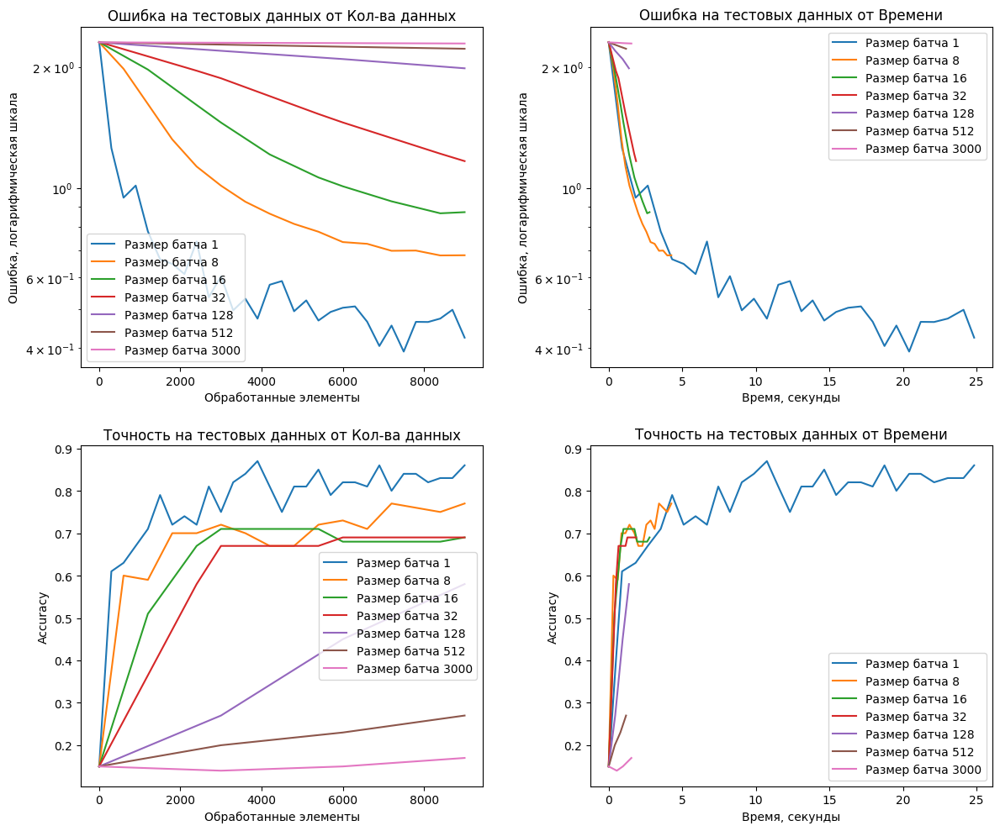

In [185]:
plot_stochastic_samples(stochastic_data, save_img_title="stochastic_samples")

## Сравнение схем подбора шага (schedulers)

In [188]:
Scheduler = tuple[
    str, Optional[Callable[[optim.Optimizer], optim.lr_scheduler.LRScheduler]]
]


def compute_sgd_schedulers(
    schedulers: list[Scheduler],
    epochs: int = 10,
    initial_learning_rate: float = 1,
    batch_size: int = 64,
    train_fraction: float = 0.1,
    test_fraction: float = 0.01,
    dataset_path: str = "../data/fashion",
    verbose: bool = True,
    seed: int = 420,
) -> dict[str, tuple[list[int], list[float], list[float], list[float]]]:
    # Загружаем FashionMNIST
    transform = transforms.Compose([transforms.ToTensor()])
    train_dataset = datasets.FashionMNIST(
        root=dataset_path, train=True, download=True, transform=transform
    )
    test_dataset = datasets.FashionMNIST(
        root=dataset_path, train=False, download=True, transform=transform
    )

    # Используем только часть данных
    train_subset = create_balanced_subset(train_dataset, subset_fraction=train_fraction)
    test_subset = create_balanced_subset(test_dataset, subset_fraction=test_fraction)

    results = {}
    for scheduler_name, scheduler_fn in schedulers:
        set_seed(seed)
        model = SimpleNN().to(DEVICE)
        criterion = nn.CrossEntropyLoss()
        optimizer = optim.SGD(model.parameters(), lr=initial_learning_rate)
        scheduler = None
        if scheduler_fn:
            scheduler = scheduler_fn(optimizer)

        train_loader = DataLoader(
            dataset=train_subset, batch_size=batch_size, shuffle=True
        )
        test_loader = DataLoader(
            dataset=test_subset, batch_size=batch_size, shuffle=False
        )

        # Считаем метрики
        initial_loss, initial_accuracy = compute_metrics(model, test_loader, criterion)

        epoch_logs = [0]
        train_loss_iter = [initial_loss]
        accuracy_iter = [initial_accuracy]
        time_logs = [0.0]
        start_time = time.time()

        seen_samples = 0
        for epoch in tqdm(range(epochs), desc=scheduler_name, disable=not verbose):
            model.train()
            for inputs, targets in train_loader:
                inputs, targets = inputs.to(DEVICE), targets.to(DEVICE)

                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, targets)
                loss.backward()
                optimizer.step()
                if scheduler:
                    scheduler.step()

                seen_samples += inputs.shape[0]

            test_loss, test_accuracy = compute_metrics(model, test_loader, criterion)
            model.train()
            epoch_logs.append(epoch + 1)
            train_loss_iter.append(test_loss)
            accuracy_iter.append(test_accuracy)
            time_logs.append(time.time() - start_time)

        results[scheduler_name] = (epoch_logs, train_loss_iter, accuracy_iter, time_logs)
    return results


def plot_sgd_schedulers(
    data: dict[str, tuple[list[int], list[float], list[float], list[float]]],
    save_img_title: Optional[str] = None,
    **kwargs,
):
    fig, axs = plt.subplots(2, 2, figsize=(12, 10), **kwargs)

    for scheduler_name, values in data.items():
        epoch_logs, train_loss_iter, accuracy_iter, time_logs = values
        label = f"Шаг {scheduler_name}"

        axs[0, 0].plot(epoch_logs, train_loss_iter, label=label)
        axs[0, 0].set_title("Ошибка на тестовых данных от Эпохи")
        axs[0, 0].set_xlabel("Эпоха")
        axs[0, 0].set_ylabel("Ошибка, логарифмическая шкала")
        axs[0, 0].set_yscale("log")
        axs[0, 0].legend()

        axs[0, 1].plot(time_logs, train_loss_iter, label=label)
        axs[0, 1].set_title("Ошибка на тестовых данных от Времени")
        axs[0, 1].set_xlabel("Время, секунды")
        axs[0, 1].set_ylabel("Ошибка, логарифмическая шкала")
        axs[0, 1].set_yscale("log")
        axs[0, 1].legend()

        axs[1, 0].plot(epoch_logs, accuracy_iter, label=label)
        axs[1, 0].set_title("Точность на тестовых данных от Эпохи")
        axs[1, 0].set_xlabel("Эпоха")
        axs[1, 0].set_ylabel("Accuracy")
        axs[1, 0].legend()

        axs[1, 1].plot(time_logs, accuracy_iter, label=label)
        axs[1, 1].set_title("Точность на тестовых данных от Времени")
        axs[1, 1].set_xlabel("Время, секунды")
        axs[1, 1].set_ylabel("Accuracy")
        axs[1, 1].legend()

    plt.tight_layout(h_pad=2, w_pad=3)
    if save_img_title:
        save_plt(save_img_title)
    plt.show()

In [182]:
schedulers_data = compute_sgd_schedulers(
    schedulers=[
        ("1", partial(optim.lr_scheduler.LambdaLR, lr_lambda=lambda _: 1)),
        ("0.1", partial(optim.lr_scheduler.LambdaLR, lr_lambda=lambda _: 0.1)),
        ("0.01", partial(optim.lr_scheduler.LambdaLR, lr_lambda=lambda _: 0.01)),
        (r"1/$k$", partial(optim.lr_scheduler.LambdaLR, lr_lambda=lambda k: 1 / (k + 1))),
        (
            r"1/$\sqrt{k}$",
            partial(optim.lr_scheduler.LambdaLR, lr_lambda=lambda k: 1 / np.sqrt(k + 1)),
        ),
        (r"${0.9}^k$", partial(optim.lr_scheduler.ExponentialLR, gamma=0.9)),
        (r"${0.99}^k$", partial(optim.lr_scheduler.ExponentialLR, gamma=0.99)),
    ]
)

${0.99}^k$: 100%|██████████| 10/10 [00:08<00:00,  1.12it/s]


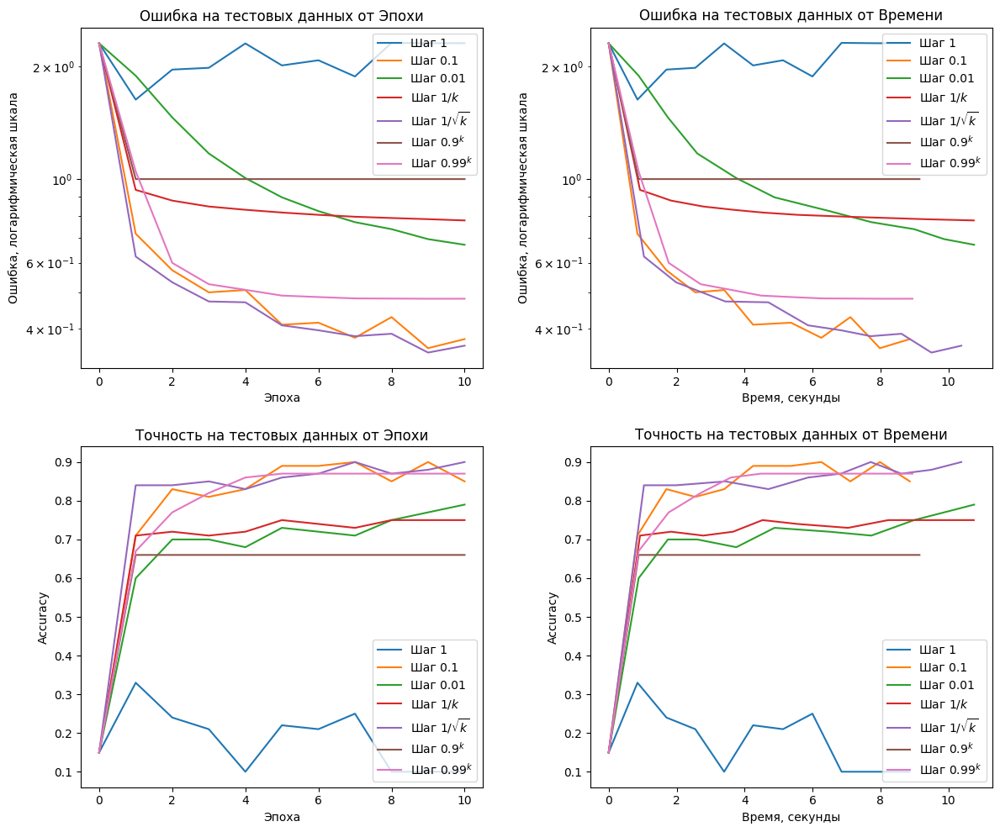

In [189]:
plot_sgd_schedulers(schedulers_data, save_img_title="sgd_schedulers")